# Exploring Data with Python On Transaction Dataset
A significant part of a a data scientist's role is to explore, analyze, and visualize data. There's a wide range of tools and programming languages that they can use to do this; and of of the most popular approaches is to use Jupyter notebooks (like this one) and Python.

# Importing necessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [2]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [3]:
import cufflinks as cf

In [4]:
init_notebook_mode(connected=True)
cf.go_offline()

In [5]:
df = pd.read_csv('ANZ synthesised transaction dataset.csv')

In [6]:
df

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,...,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,...,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,...,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,...,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,...,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12038,authorized,0.0,NaN,ACC-3021093232,AUD,149.83 -29.47,POS,32aa73dc-b7c2-4161-b14d-6271b96ce792,NaN,Melissa,...,30,Ringwood,VIC,2018-10-31T23:09:06.000+0000,9.79,f2e3e695c2ee4c50a4c8747f852cbe2e,Australia,CUS-55310383,145.23 -37.81,debit
12039,authorized,1.0,NaN,ACC-1608363396,AUD,151.22 -33.87,SALES-POS,296a0500-8552-48ac-ac81-ec37065b568e,NaN,Robert,...,20,Casula,NSW,2018-10-31T23:21:46.000+0000,63.87,56e147e5485f4683b9076fcaaed76640,Australia,CUS-2688605418,150.88 -33.96,debit
12040,authorized,1.0,NaN,ACC-3827517394,AUD,151.12 -33.89,POS,e5975ab4-08f7-4725-a369-24cc0e35ed6e,NaN,Craig,...,28,Kings Park,NSW,2018-10-31T23:34:25.000+0000,43.96,2fdd4681827343f6af2e6519644a684a,Australia,CUS-2663907001,150.92 -33.74,debit
12041,authorized,1.0,NaN,ACC-2920611728,AUD,144.96 -37.76,SALES-POS,af49051a-591d-4b08-bd3c-27730b70ed37,NaN,Tyler,...,69,Oakleigh,VIC,2018-10-31T23:47:05.000+0000,30.77,74aa9cd7e4af4c6d9cd7dbd28e9aedc9,Australia,CUS-1388323263,145.09 -37.91,debit


In [7]:
df.shape

(12043, 23)

This set contains 12043 entries and 23 columns

****Checking the data to clean if necessary

In [8]:
df.head()

,status,card_present_flag,bpay_biller_code,account,currency,long_lat,txn_description,merchant_id,merchant_code,first_name,...,age,merchant_suburb,merchant_state,extraction,amount,transaction_id,country,customer_id,merchant_long_lat,movement
0,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,POS,81c48296-73be-44a7-befa-d053f48ce7cd,NaN,Diana,...,26,Ashmore,QLD,2018-08-01T01:01:15.000+0000,16.25,a623070bfead4541a6b0fff8a09e706c,Australia,CUS-2487424745,153.38 -27.99,debit
1,authorized,0.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,830a451c-316e-4a6a-bf25-e37caedca49e,NaN,Diana,...,26,Sydney,NSW,2018-08-01T01:13:45.000+0000,14.19,13270a2a902145da9db4c951e04b51b9,Australia,CUS-2487424745,151.21 -33.87,debit
2,authorized,1.0,NaN,ACC-1222300524,AUD,151.23 -33.94,POS,835c231d-8cdf-4e96-859d-e9d571760cf0,NaN,Michael,...,38,Sydney,NSW,2018-08-01T01:26:15.000+0000,6.42,feb79e7ecd7048a5a36ec889d1a94270,Australia,CUS-2142601169,151.21 -33.87,debit
3,authorized,1.0,NaN,ACC-1037050564,AUD,153.10 -27.66,SALES-POS,48514682-c78a-4a88-b0da-2d6302e64673,NaN,Rhonda,...,40,Buderim,QLD,2018-08-01T01:38:45.000+0000,40.90,2698170da3704fd981b15e64a006079e,Australia,CUS-1614226872,153.05 -26.68,debit
4,authorized,1.0,NaN,ACC-1598451071,AUD,153.41 -27.95,SALES-POS,b4e02c10-0852-4273-b8fd-7b3395e32eb0,NaN,Diana,...,26,Mermaid Beach,QLD,2018-08-01T01:51:15.000+0000,3.25,329adf79878c4cf0aeb4188b4691c266,Australia,CUS-2487424745,153.44 -28.06,debit


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12043 entries, 0 to 12042
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   status             12043 non-null  object 
 1   card_present_flag  7717 non-null   float64
 2   bpay_biller_code   885 non-null    object 
 3   account            12043 non-null  object 
 4   currency           12043 non-null  object 
 5   long_lat           12043 non-null  object 
 6   txn_description    12043 non-null  object 
 7   merchant_id        7717 non-null   object 
 8   merchant_code      883 non-null    float64
 9   first_name         12043 non-null  object 
 10  balance            12043 non-null  float64
 11  date               12043 non-null  object 
 12  gender             12043 non-null  object 
 13  age                12043 non-null  int64  
 14  merchant_suburb    7717 non-null   object 
 15  merchant_state     7717 non-null   object 
 16  extraction         120

In [10]:
df.isnull().sum()

status                   0
card_present_flag     4326
bpay_biller_code     11158
account                  0
currency                 0
long_lat                 0
txn_description          0
merchant_id           4326
merchant_code        11160
first_name               0
balance                  0
date                     0
gender                   0
age                      0
merchant_suburb       4326
merchant_state        4326
extraction               0
amount                   0
transaction_id           0
country                  0
customer_id              0
merchant_long_lat     4326
movement                 0
dtype: int64

****if we observe above count values the bpay_biller_code and merchant_code columns have higher null values. so that can remove those columns from the dataset

In [11]:
df.drop(['bpay_biller_code','merchant_code'], axis=1, inplace = True)

In [12]:
df.columns

Index(['status', 'card_present_flag', 'account', 'currency', 'long_lat',
       'txn_description', 'merchant_id', 'first_name', 'balance', 'date',
       'gender', 'age', 'merchant_suburb', 'merchant_state', 'extraction',
       'amount', 'transaction_id', 'country', 'customer_id',
       'merchant_long_lat', 'movement'],
      dtype='object')

In [13]:
df.isnull().sum()

status                  0
card_present_flag    4326
account                 0
currency                0
long_lat                0
txn_description         0
merchant_id          4326
first_name              0
balance                 0
date                    0
gender                  0
age                     0
merchant_suburb      4326
merchant_state       4326
extraction              0
amount                  0
transaction_id          0
country                 0
customer_id             0
merchant_long_lat    4326
movement                0
dtype: int64

****Merchant data has null values and all null values count are same.
Lets find are they common for rows

In [14]:
import missingno as msno

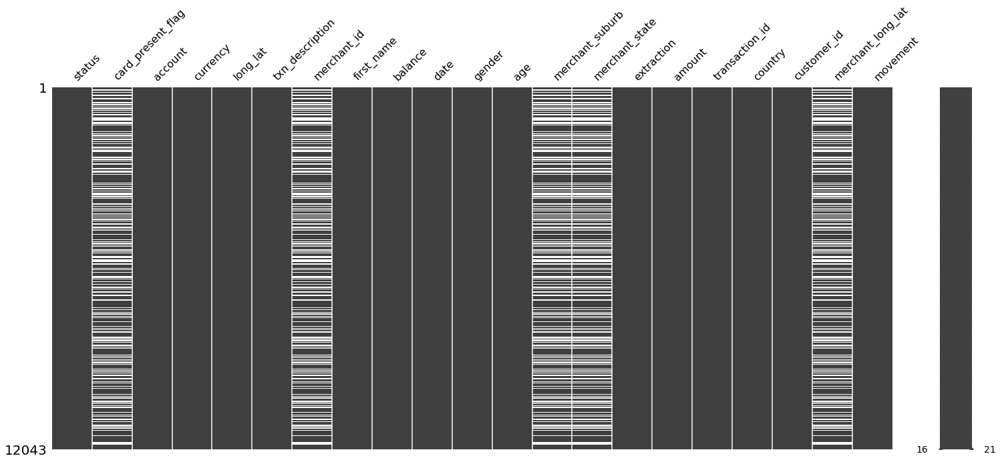

In [15]:
msno.matrix(df)

****we can find the missing values are common with rows. Therefore let's eliminate the rows

In [16]:
df.dropna(inplace=True)

****Now lets check the dataframe after eliminating certain rows

In [17]:
df.count().iplot(kind='bar')

In [18]:
df.shape

(7717, 21)

This new dataset contains 7717 entries and 21 columns

# ****Let's analyse the data set by considering each column

# Status

In [19]:
df.status.value_counts()

authorized    7717
Name: status, dtype: int64

****It has only one value and it will create kind of noise in predictive analysis so better if we remove this column

In [20]:
df.drop('status',axis=1,inplace=True)

# card_present_flag

In [21]:
df['card_present_flag'].value_counts()

1.0    6194
0.0    1523
Name: card_present_flag, dtype: int64

(array([1523.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        6194.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

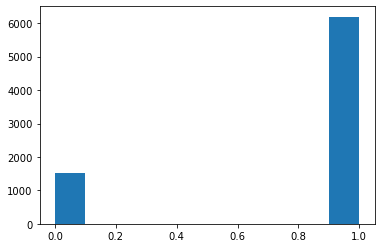

In [22]:
plt.hist(df['card_present_flag'])

In [23]:
df.iplot(kind='hist',x='card_present_flag')

****card_present_flag is pretty much imbalanced

# long_lat

In [24]:
df.long_lat.value_counts()

153.41 -27.95    531
151.23 -33.94    276
116.06 -32.00    248
153.10 -27.66    220
153.05 -27.61    206
                ... 
144.98 -37.84      9
130.98 -12.49      9
149.03 -34.97      4
145.01 -37.93      4
145.09 -37.82      3
Name: long_lat, Length: 100, dtype: int64

In [25]:
x_y = df['long_lat'].str.split(" ", n = 1, expand = True) 
df['long'] = x_y[0].astype(float)
df['lat'] = x_y[1].astype(float)

In [26]:
import math
import folium
from folium.plugins import MarkerCluster

In [27]:
map = folium.Map(location=['-25.2744','133.7751'],tiles='cartodbpositron',zoom_start=5)

In [28]:
mc = MarkerCluster()
for idx, row in df.iterrows():
    if not math.isnan(row['long']) and not math.isnan(row['lat']):
        mc.add_child(folium.Marker([row['lat'], row['long']]))
map.add_child(mc)


# From the above map we can conclude that maximum amount of transactions done from Gold coast, Brisbane, Melbourne, Sydney and Perth.


# account

In [34]:
df['account'].value_counts()

ACC-1598451071    531
ACC-1222300524    276
ACC-182446574     248
ACC-1037050564    220
ACC-1903037542    206
                 ... 
ACC-4059612845      9
ACC-4281711154      9
ACC-1650504218      4
ACC-4163822186      4
ACC-721712940       3
Name: account, Length: 100, dtype: int64

****the account column actually describes the account numbers and this doesn't take much part in prediction analysis. so lets drop this column

In [35]:
df.drop('account',axis=1,inplace=True)

# currency

In [36]:
df['currency'].value_counts()

AUD    7717
Name: currency, dtype: int64

****Dropping this column too because of single value nature

In [37]:
df.drop(['currency'],axis=1,inplace=True)

# txn_description

In [38]:
df['txn_description'].value_counts()

SALES-POS    3934
POS          3783
Name: txn_description, dtype: int64

([0, 1], <a list of 2 Text xticklabel objects>)

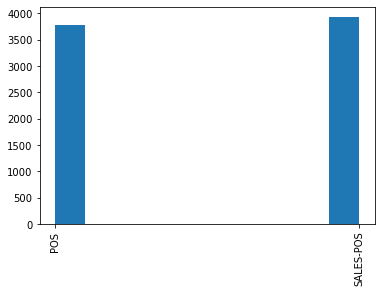

In [39]:
plt.hist(df['txn_description'])
plt.xticks(rotation=90)

****we see that SALES-POS is the most used method by customers. Followed by POS is Payment.The column data is balanced and evenly distributed

****Let's convert the string into numeric type

In [40]:
txn_numeric = {"txn_description":{"POS": 0, "SALES-POS":1}}
df.replace(txn_numeric, inplace=True)

****Replaced by numeric values

# merchant_id 

In [41]:
df['merchant_id'].value_counts()

106e1272-44ab-4dcb-a438-dd98e0071e51    14
6c84c219-96ea-4c6f-9de5-0a28bcaec62f    12
e28c426d-cbef-4e2d-aa06-1ba0b6b1902f    11
6ddddc40-5b69-4253-8a26-167999a8bf96    10
aef30de1-c67e-4ab7-8577-2931a4bf3c7e    10
                                        ..
abc95c52-7dc7-46d2-966b-efb49095ad99     1
756f83f0-4796-420b-89ff-847bab77f1e2     1
c3895ade-aef8-46f2-a13c-3f22213c14da     1
cb39705d-436f-4b8b-b543-d339e092c99d     1
9833296d-81dd-4baa-bc6c-8c9151e644bf     1
Name: merchant_id, Length: 5725, dtype: int64

****This data isn't much human readable and of no use. so just dropping it

In [42]:
df.drop(['merchant_id'],axis=1,inplace=True)

# first_name

In [43]:
df.first_name.value_counts()

Diana       531
Michael     519
Jeffrey     316
Joseph      306
Jessica     286
           ... 
David        14
Jonathan      9
Marissa       4
Karen         4
Andrew        3
Name: first_name, Length: 80, dtype: int64

# balance

In [44]:
df.balance.value_counts()

4990.31     2
6630.94     2
3808.18     2
2321.06     2
2786.80     2
           ..
21478.35    1
4733.21     1
11507.30    1
47894.07    1
0.25        1
Name: balance, Length: 7698, dtype: int64

(array([7.117e+03, 3.150e+02, 1.600e+02, 7.000e+00, 2.100e+01, 0.000e+00,
        3.000e+00, 7.700e+01, 0.000e+00, 1.700e+01]),
 array([2.40000000e-01, 2.67095820e+04, 5.34189240e+04, 8.01282660e+04,
        1.06837608e+05, 1.33546950e+05, 1.60256292e+05, 1.86965634e+05,
        2.13674976e+05, 2.40384318e+05, 2.67093660e+05]),
 <a list of 10 Patch objects>)

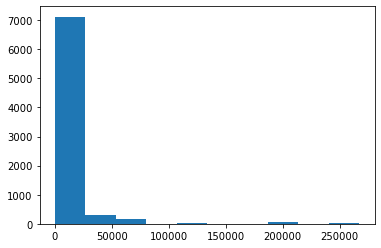

In [45]:
plt.hist(df.balance)

****There are outliers here just getting rid of that

In [46]:
df = df[df['balance']<=100000]

(array([4648., 1648.,  617.,  206.,  112.,   61.,  114.,   40.,   92.,
          54.]),
 array([2.4000000e-01, 6.9646930e+03, 1.3929146e+04, 2.0893599e+04,
        2.7858052e+04, 3.4822505e+04, 4.1786958e+04, 4.8751411e+04,
        5.5715864e+04, 6.2680317e+04, 6.9644770e+04]),
 <a list of 10 Patch objects>)

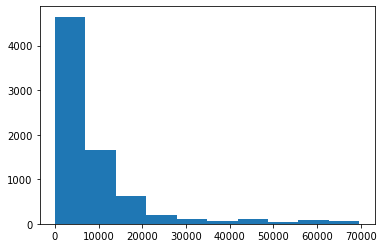

In [47]:
plt.hist(df.balance)

# date

In [48]:
df.date.value_counts()

2018-01-09    109
2018-09-28    108
2018-09-21    105
2018-08-17    105
2018-08-18    104
             ... 
2018-06-08     53
2018-10-16     50
2018-10-30     49
2018-08-10     49
2018-10-23     48
Name: date, Length: 91, dtype: int64

In [49]:
type(df.date[0])

pandas._libs.tslibs.timestamps.Timestamp

****Here we can see type of date is str, which is not good.
Converting it to date type and splitting date into only month and year

In [50]:
df['date']= pd.to_datetime(df['date']) 
df['year'] = pd.DatetimeIndex(df['date']).year
df['month'] = pd.DatetimeIndex(df['date']).month


In [51]:
df.year.value_counts()

2018    7592
Name: year, dtype: int64

****we know that all the transactions happened in 2018 year and removing this column makes no changes in dataset

In [52]:
df.month.value_counts()

10    1800
9     1790
8     1730
4      270
5      261
2      260
12     259
1      249
3      248
11     247
6      244
7      234
Name: month, dtype: int64

****we can see that highest transactions happened in the months of Oct, Sept and Aug

# gender

In [53]:
df['gender'].value_counts()

M    3810
F    3782
Name: gender, dtype: int64

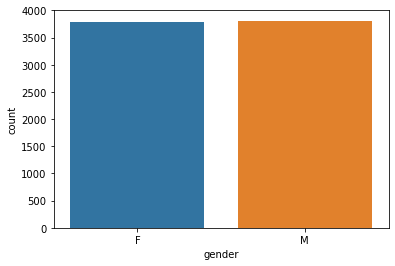

In [54]:
sns.countplot(x='gender',data=df)

****greatly balanced and let's convert this into numeric

In [55]:
gender_numeric = {"gender":{"M": 0, "F": 1}}
df.replace(gender_numeric, inplace=True)

(array([3810.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,    0.,
        3782.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

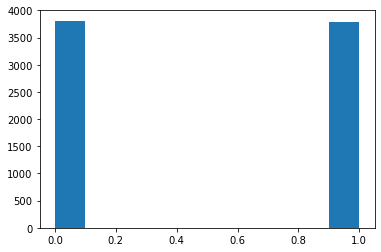

In [56]:
plt.hist(df.gender)

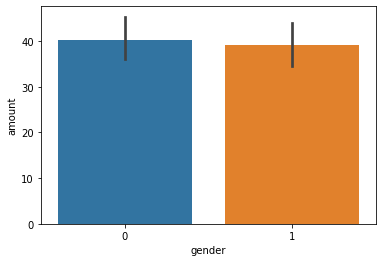

In [57]:
sns.barplot(x='gender',y='amount',data=df)

# age

(array([2045., 2252., 1207., 1328.,  523.,  122.,    0.,   59.,   53.,
           3.]),
 array([18., 24., 30., 36., 42., 48., 54., 60., 66., 72., 78.]),
 <a list of 10 Patch objects>)

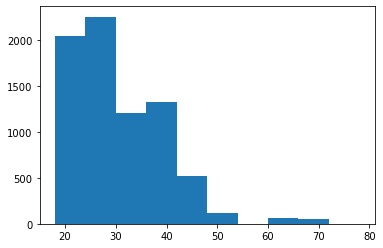

In [58]:
plt.hist(df.age)

****We can observe there are certain outliers but the age values in transaction like dataset can have some meaningful observations and so lets not remove them

# merchant_suburb

In [59]:
df['merchant_suburb'].value_counts()

Melbourne          251
Sydney             230
Southport           82
Brisbane City       79
Chatswood           54
                  ... 
Kilsyth South        1
Darra                1
Frankston North      1
Zillmere             1
Woodburn             1
Name: merchant_suburb, Length: 1587, dtype: int64

(array([2185., 1311.,  897.,  874.,  621.,  515.,  416.,  316.,  264.,
         193.]),
 array([   0. ,  158.6,  317.2,  475.8,  634.4,  793. ,  951.6, 1110.2,
        1268.8, 1427.4, 1586. ]),
 <a list of 10 Patch objects>)

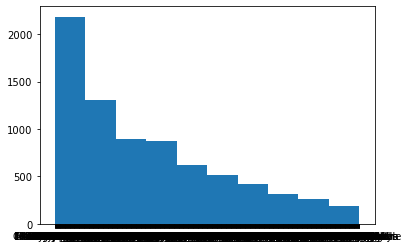

In [60]:
plt.hist(df.merchant_suburb)

In [61]:
df['merchant_suburb'].nunique()

1587

# merchant_state

In [62]:
df['merchant_state'].value_counts()

NSW    2153
VIC    2044
QLD    1538
WA     1100
SA      414
NT      205
ACT      73
TAS      65
Name: merchant_state, dtype: int64

In [63]:
df.extraction.value_counts()

2018-09-10T09:23:21.000+0000    1
2018-09-08T09:19:21.000+0000    1
2018-09-02T21:11:08.000+0000    1
2018-10-11T09:18:20.000+0000    1
2018-08-24T14:34:33.000+0000    1
                               ..
2018-10-28T10:07:16.000+0000    1
2018-09-28T17:03:31.000+0000    1
2018-08-29T10:47:53.000+0000    1
2018-09-16T21:48:20.000+0000    1
2018-09-26T12:11:51.000+0000    1
Name: extraction, Length: 7592, dtype: int64

****these are probably timestamps let's remove this for now

In [64]:
df.drop(['extraction'],axis=1,inplace=True)

# amount

(array([7.556e+03, 2.500e+01, 5.000e+00, 1.000e+00, 1.000e+00, 3.000e+00,
        0.000e+00, 0.000e+00, 0.000e+00, 1.000e+00]),
 array([1.000000e-01, 7.081990e+02, 1.416298e+03, 2.124397e+03,
        2.832496e+03, 3.540595e+03, 4.248694e+03, 4.956793e+03,
        5.664892e+03, 6.372991e+03, 7.081090e+03]),
 <a list of 10 Patch objects>)

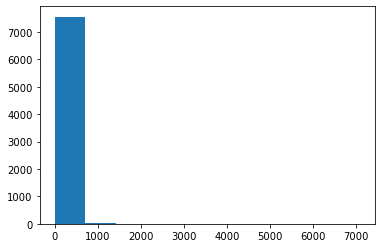

In [65]:
plt.hist(df.amount)

In [66]:
df.iplot(kind='bar',x='amount')

****we can see there is an outlier near 7000 

****Let's describe the amount column to view insights

In [67]:
perc =[.75,.85,.99] 
df.amount.describe(percentiles=perc)

count    7592.000000
mean       39.738494
std       149.236864
min         0.100000
50%        19.510000
75%        33.412500
85%        46.408000
99%       377.877300
max      7081.090000
Name: amount, dtype: float64

In [68]:
df=df[df['amount']<378]

# transaction_id

In [69]:
df['transaction_id'].value_counts()

194bec6281dc4780a93eda1356f43952    1
1175e4595d3749f497c9c80bf5baf3fb    1
ac0356567534496092a938db0d8b7892    1
c679dc46a9994e7a8c86b60aab049b8c    1
fe7fbb77ce474e2fa133599b1d3fbc8a    1
                                   ..
1d99982883eb4f5e912f251e9d819793    1
2b20becf8e534f78897bf7ecbf0df658    1
38317408e21740a4bd2b36281d2c64e0    1
28d5f74838574077a95800afa3feeef1    1
88bbee6ec2794d7082650720a5a05281    1
Name: transaction_id, Length: 7516, dtype: int64

In [70]:
df.drop(['transaction_id'],axis=1,inplace=True)

# country

In [71]:
df['country'].value_counts()

Australia    7516
Name: country, dtype: int64

****Let's drop this because of single value nature

In [72]:
df.drop(['country'],axis=1,inplace=True)

In [73]:
df['customer_id'].value_counts()

CUS-2487424745    529
CUS-2142601169    272
CUS-3026014945    247
CUS-1614226872    220
CUS-860700529     205
                 ... 
CUS-495599312       9
CUS-3151318058      8
CUS-2500783281      4
CUS-2630892467      4
CUS-1646183815      3
Name: customer_id, Length: 97, dtype: int64

In [74]:
df.drop(['customer_id'],axis=1,inplace=True)

# merchant_long_lat

In [75]:
df['merchant_long_lat'].value_counts()

151.21 -33.87    137
144.96 -37.82     82
144.97 -37.81     58
144.96 -37.81     56
153.02 -27.47     46
                ... 
150.97 -33.93      1
151.22 -33.85      1
152.65 -27.46      1
151.08 -33.84      1
150.85 -33.75      1
Name: merchant_long_lat, Length: 2651, dtype: int64

In [76]:
df.drop(['merchant_long_lat'],axis=1,inplace=True)

# movement

In [77]:
df['movement'].value_counts()


debit    7516
Name: movement, dtype: int64

********Let's drop this because of single value nature

In [78]:
df.drop(['movement'],axis=1,inplace=True)


<Figure size 1800x1440 with 0 Axes>

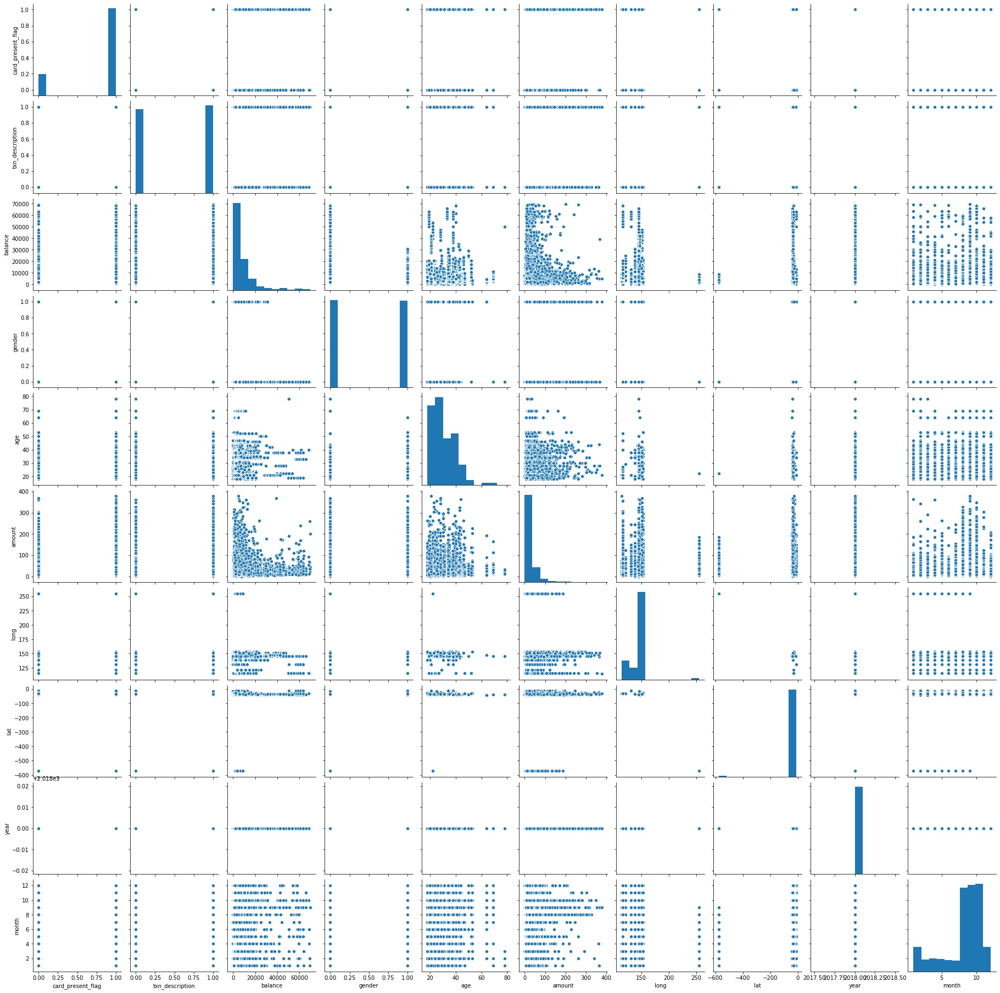

In [79]:
plt.figure(figsize=(25,20))
f=sns.pairplot(df,palette='coolwarm')

# ****Noting some Imp Insights

In [92]:
# Convert the date column from string to datetime type
df['date']=pd.to_datetime(df['date'])

In [93]:
#Total transaction amount on particular day
dfdate = df.groupby(['date']).sum()['amount']
dfdate

date
2018-01-08    1953.13
2018-01-09    3653.70
2018-01-10    1798.07
2018-02-08    3220.88
2018-02-09    2787.80
               ...   
2018-11-09    2070.68
2018-11-10    2387.15
2018-12-08    1993.12
2018-12-09    2361.30
2018-12-10    2757.67
Name: amount, Length: 91, dtype: float64

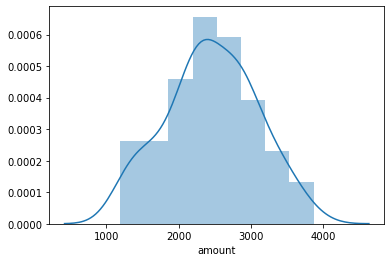

In [94]:
#Let's Visualize this
sns.distplot(dfdate)

In [95]:
dfd = pd.DataFrame(dfdate)
dfd.reset_index(inplace=True)
dfd

,date,amount
0,2018-01-08,1953.13
1,2018-01-09,3653.70
2,2018-01-10,1798.07
3,2018-02-08,3220.88
4,2018-02-09,2787.80
...,...,...
86,2018-11-09,2070.68
87,2018-11-10,2387.15
88,2018-12-08,1993.12
89,2018-12-09,2361.30


In [96]:
#Total transaction amount on particular month
dfmonth = df.groupby(['month']).sum()['amount']
dfmonth

month
1      7404.90
2      8416.36
3      6614.93
4      8068.64
5      7576.46
6      6160.24
7      6766.33
8     51179.60
9     54094.79
10    52478.82
11     7096.97
12     7112.09
Name: amount, dtype: float64

In [97]:
#count of transactions done on particular month
df.groupby(['month'])['amount'].count()

month
1      246
2      259
3      246
4      268
5      259
6      238
7      227
8     1718
9     1770
10    1786
11     245
12     254
Name: amount, dtype: int64

In [98]:
px.line(df.groupby(['month'])['amount'].count())

# Total number of  transactions done are high during the months of August,september and october

In [111]:
#checking average transaction of the month of august
df.loc[df['month']==8]['amount'].mean()

29.79022118742719

In [112]:
#checking maximum transaction of the month of August
df.loc[df['month']==8]['amount'].max()

326.69

In [113]:
#checking minimum transaction of the month of August
df.loc[df['month']==8]['amount'].min()

1.52

In [114]:
#The customer made the max transaction on the month of August
df[df['amount'] == df.loc[df['month']==8]['amount'].max()]['first_name']

2322    Isaiah
Name: first_name, dtype: object

In [115]:
#The customer made the min transaction on the month of August
df[df['amount'] == df.loc[df['month']==8]['amount'].min()]['first_name']

1716    Edward
Name: first_name, dtype: object

In [116]:
#checking average transaction of the month of sept
df.loc[df['month']==9]['amount'].mean()

30.56202824858762

In [117]:
#checking maximum transaction of the month of sept
df.loc[df['month']==9]['amount'].max()

377.79

In [118]:
#checking minimum transaction of the month of sept
df.loc[df['month']==9]['amount'].min()

0.1

In [119]:
#The customer made the max transaction on the month of sept
df[df['amount'] == df.loc[df['month']==9]['amount'].max()]['first_name']

6611    Kaitlyn
Name: first_name, dtype: object

In [120]:
#The customers made the min transaction on the month of sept
df[df['amount'] == df.loc[df['month']==9]['amount'].min()]['first_name']

5395     Jacqueline
6428        Jeffrey
6592      Catherine
8188          Diana
11523         Derek
Name: first_name, dtype: object

In [103]:
#checking average transaction of the month of October
df.loc[df['month']==10]['amount'].mean()

29.383437849944013

In [104]:
#checking maximum transaction of the month of October
df.loc[df['month']==10]['amount'].max()

348.21

In [105]:
#checking minimum transaction of the month of October
df.loc[df['month']==10]['amount'].min()

0.1

In [108]:
#The customers made the max transaction on the month of oct
df[df['amount'] == df.loc[df['month']==10]['amount'].max()]['first_name']

11958    Scott
Name: first_name, dtype: object

In [110]:
#The customer made the min transaction on the month of oct
df[df['amount'] == df.loc[df['month']==10]['amount'].min()]['first_name']

5395     Jacqueline
6428        Jeffrey
6592      Catherine
8188          Diana
11523         Derek
Name: first_name, dtype: object

In [86]:
dfm = pd.DataFrame(dfmonth)
dfm.reset_index(inplace=True)
dfm

,month,amount
0,1,7404.90
1,2,8416.36
2,3,6614.93
3,4,8068.64
4,5,7576.46
5,6,6160.24
6,7,6766.33
7,8,51179.60
8,9,54094.79
9,10,52478.82


In [87]:
#let's visualize the transaction amount done on particular month
dfm.iplot(kind='scatter',x='month',y='amount',mode='markers',size=10)

In [88]:
import plotly.express as px

In [89]:
# average amount of transaction
px.line(dfd.groupby(['date']).mean()['amount'])

In [90]:
# mean of amount of transactions executed per day
dfd.groupby(['date']).sum()['amount'].mean()

2450.221208791207

****Mean amount of transactions done per day is 2450.22

In [91]:
px.bar(df,x=df['merchant_state'].dropna().unique(),y=df.groupby(['merchant_state']).sum()['amount'])

****Above visualization describes about the amount of transaction done statewise

# Here we can conclude that the New South Wales and Tasmania states have transacrtions with very high amounts. While Queensland, Victoria and northern territory have low amounts of transactions.


# Insights achieved from dataset:


1. Both females and males have nearly equal amount of authorized transactions 
2. Mean amount of transactions done per day : 2450.221208791207
3. The New South Wales and Tasmania states have transacrtions with very high amounts,
   while Queensland, Victoria and northan territory have low amounts of transactions
4. Total number of transactions done are high during the months of August,september and october.
5. The majority transactions done from Gold coast, Brisbane, Melbourne, Sydney and Perth.

#4.(a). **average transaction of the month of August: 29.7902211AUD.-----------------
        **maximum transaction of the month of August: 326.69AUD.-----------------
        **minimum transaction of the month of August: 1.52AUD.-----------------
        **The customer made the max transaction on the month of August: Isaiah.-----------------
        **The customer made the min transaction on the month of August: Edward.
#4.(b). **average transaction of the month of sept: 30.562AUD.-----------------
        **maximum transaction of the month of Sept: 377.79AUD.-----------------
        **minimum transaction of the month of Sept: 0.1AUD.-----------------
        **The customer made the max transaction on the month of Sept: Kaitlyn.-----------------
        **The customers made the min transaction on the month of Sept: Jacqueline,Jeffrey,Catherine,Diana and Derek.
#4.(c). **average transaction of the month of Oct: 29.383AUD.-----------------
        **maximum transaction of the month of Oct: 348.21AUD.-----------------
        **minimum transaction of the month of Oct: 0.1AUD.-----------------
        **The customer made the max transaction on the month of Oct: Scott.-----------------
        **The customers made the min transaction on the month of Oct: Jacqueline,Jeffrey,Catherine,Diana and Derek.
       